In [1]:
%matplotlib inline
import pandas as pd
import geopandas as gpd
import libpysal as lp
import matplotlib.pyplot as plt
import rasterio as rio
import numpy as np
import contextily as ctx
import shapely.geometry as geom

In [2]:
df = gpd.read_file('berlin-districts.geojson')
df.head()

,district,district_group,median_price,geometry
0,Blankenfelde/Niederschönhausen,Pankow,37.5,"MULTIPOLYGON (((1493006.880 6912074.798, 14929..."
1,Helmholtzplatz,Pankow,58.0,"MULTIPOLYGON (((1493245.549 6900059.696, 14932..."
2,Wiesbadener Straße,Charlottenburg-Wilm.,50.0,"MULTIPOLYGON (((1481381.452 6885170.698, 14813..."
3,Schmöckwitz/Karolinenhof/Rauchfangswerder,Treptow - Köpenick,99.0,"MULTIPOLYGON (((1526159.829 6872101.044, 15261..."
4,Müggelheim,Treptow - Köpenick,25.0,"MULTIPOLYGON (((1529265.086 6874326.842, 15292..."


In [3]:
import seaborn as sbn

C:\Users\Ivan\.conda\envs\geopandas_env\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='median_price', ylabel='Density'>

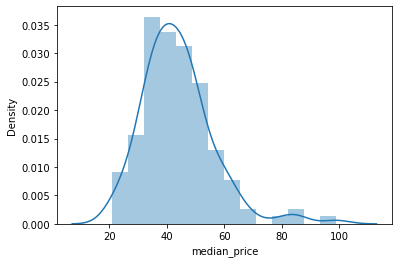

In [4]:
sbn.distplot(df['median_price'])

C:\Users\Ivan\.conda\envs\geopandas_env\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Ivan\.conda\envs\geopandas_env\lib\site-packages\seaborn\distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='median_price', ylabel='Density'>

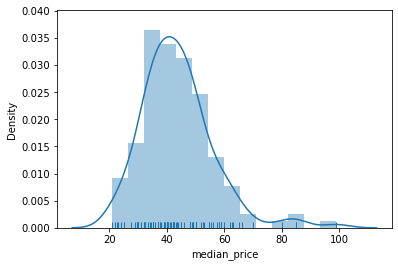

In [5]:
sbn.distplot(df['median_price'], rug=True)

## Spatial distribution

<AxesSubplot:>

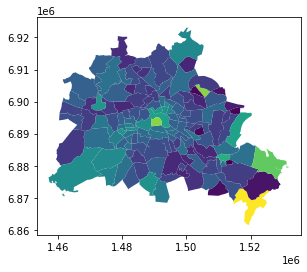

In [6]:
df.plot(column='median_price')

<AxesSubplot:>

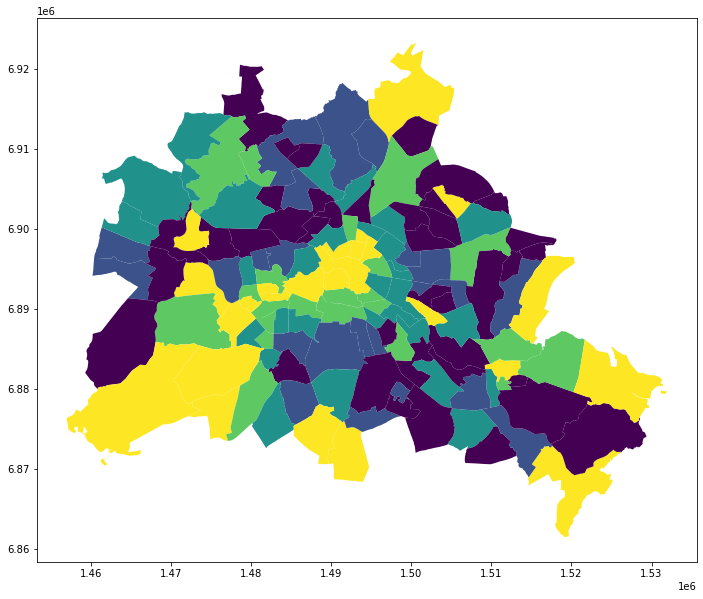

In [7]:
fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'aspect': 'equal'})
df.plot(column='median_price', scheme='Quantiles', ax=ax)

<AxesSubplot:>

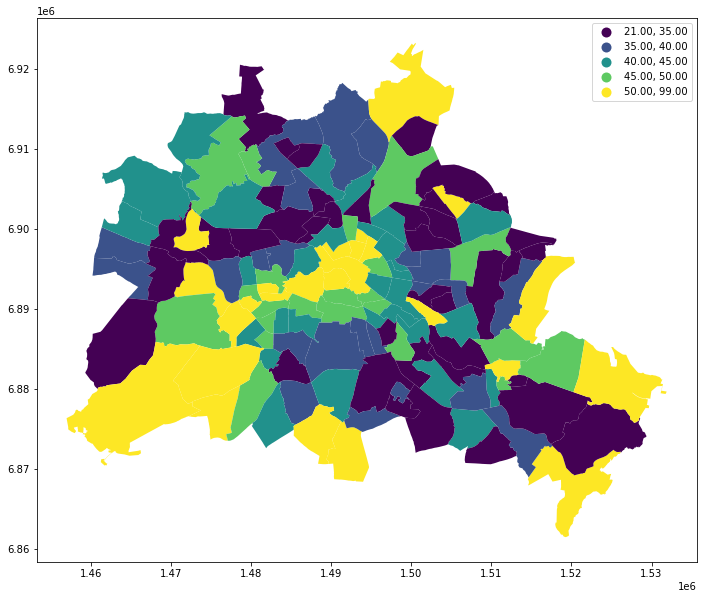

In [8]:
fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'aspect': 'equal'})
df.plot(column='median_price', scheme='Quantiles', ax=ax, legend=True)
# Five classes in the legend are the quintiles for the attribute distribution

<AxesSubplot:>

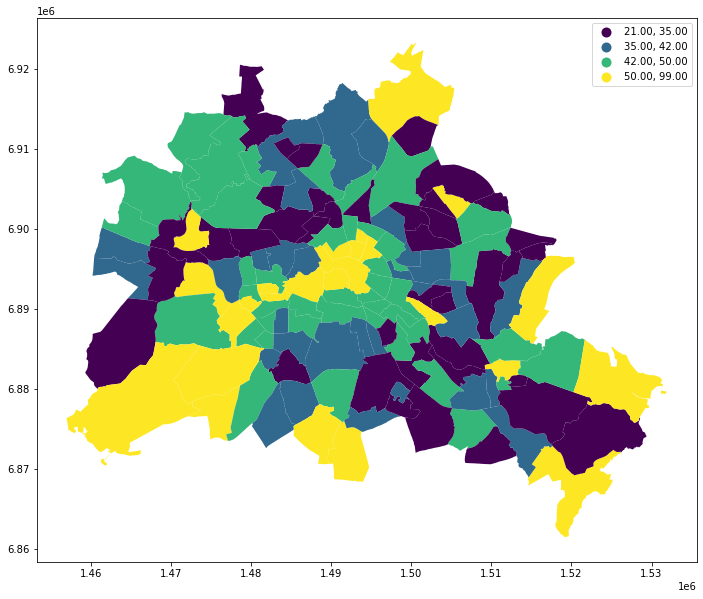

In [9]:
fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'aspect': 'equal'})
df.plot(column='median_price', scheme='Quantiles', k=4, ax=ax, legend=True)
# with option k=4, we can show quartile classification

<AxesSubplot:>

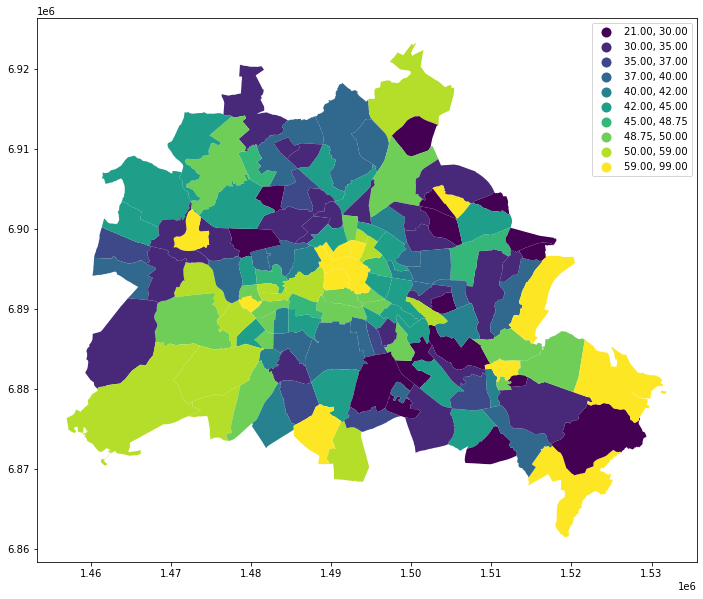

In [10]:
fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'aspect': 'equal'})
df.plot(column='median_price', scheme='Quantiles', k=10, ax=ax, legend=True)

<AxesSubplot:>

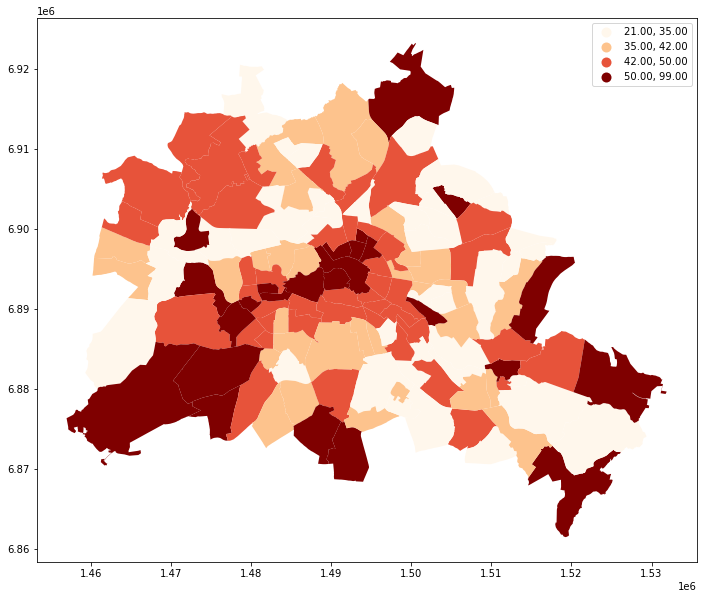

In [11]:
fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'aspect': 'equal'})
df.plot(column='median_price', scheme='Quantiles', k=4, ax=ax, legend=True, cmap='OrRd')
# color map changes hues for the classes

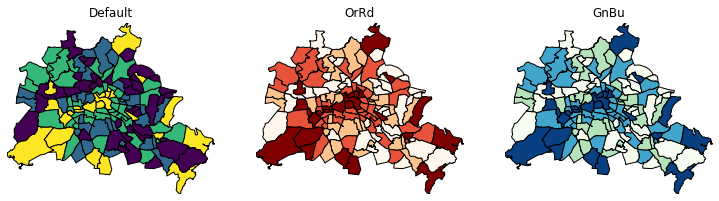

In [12]:
# Both the color ramp and the classification scheme can have substantial impats on the resulting visualization.
# Geopandas makes it straightforward to explore these dimensions

f, ax = plt.subplots(1, 3, figsize=(3.16 * 4, 4), subplot_kw=dict(aspect='equal'))
df.plot(column='median_price', ax=ax[0], edgecolor='k', scheme='quantiles', k=4)
ax[0].axis(df.total_bounds[np.asarray([0, 2, 1, 3])])
ax[0].set_title('Default')
df.plot(column='median_price', ax=ax[1], edgecolor='k', scheme='quantiles', cmap='OrRd', k=4)
ax[1].axis(df.total_bounds[np.asarray([0, 2, 1, 3])])
ax[1].set_title('OrRd')
df.plot(column='median_price', ax=ax[2], edgecolor='k', scheme='quantiles', cmap='GnBu', k=4)
ax[2].axis(df.total_bounds[np.asarray([0, 2, 1, 3])])
ax[2].set_title('GnBu')
ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')
plt.show()

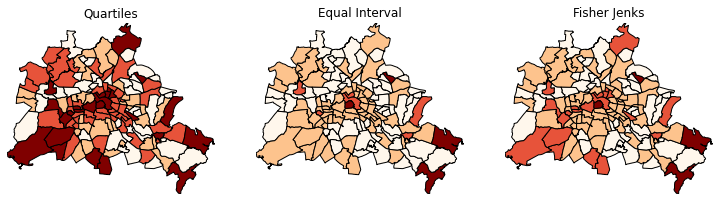

In [13]:
# We can change the classification scheme

f, ax = plt.subplots(1, 3, figsize=(3.16 * 4, 4), subplot_kw=dict(aspect='equal'))
df.plot(column='median_price', ax=ax[0], edgecolor='k', scheme='quantiles', k=4, cmap='OrRd')
ax[0].axis(df.total_bounds[np.asarray([0, 2, 1, 3])])
ax[0].set_title('Quartiles')
df.plot(column='median_price', ax=ax[1], edgecolor='k', scheme='equal_interval', cmap='OrRd', k=4)
ax[1].axis(df.total_bounds[np.asarray([0, 2, 1, 3])])
ax[1].set_title('Equal Interval')
df.plot(column='median_price', ax=ax[2], edgecolor='k', scheme='fisher_jenks', cmap='OrRd', k=4)
ax[2].axis(df.total_bounds[np.asarray([0, 2, 1, 3])])
ax[2].set_title('Fisher Jenks')
ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')
plt.show()

In [14]:
import mapclassify as mc

# mapclassify offers a number of schemes for choropleth mapping
mc.CLASSIFIERS

('BoxPlot',
 'EqualInterval',
 'FisherJenks',
 'FisherJenksSampled',
 'HeadTailBreaks',
 'JenksCaspall',
 'JenksCaspallForced',
 'JenksCaspallSampled',
 'MaxP',
 'MaximumBreaks',
 'NaturalBreaks',
 'Quantiles',
 'Percentiles',
 'StdMean',
 'UserDefined')

In [15]:
# Equal intervals splits the data range into k equal-width bins
y = df['median_price']
ea5 = mc.EqualInterval(y, k=5)

In [16]:
ea5

EqualInterval         

   Interval      Count
----------------------
[21.00, 36.60] |    40
(36.60, 52.20] |    74
(52.20, 67.80] |    19
(67.80, 83.40] |     2
(83.40, 99.00] |     3

In [17]:
# Among its attributes are the bin ids each observation is classified into
ea5.yb

array([1, 2, 1, 4, 0, 0, 0, 1, 1, 2, 1, 1, 1, 2, 2, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 2, 2, 2, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 2, 1, 2, 2, 2, 1, 1, 1, 0, 1, 0, 0,
       1, 4, 1, 0, 0, 1, 1, 1, 0, 3, 1, 1, 0, 1, 3, 1, 1, 0, 0, 0, 0, 1,
       1, 1, 1, 0, 1, 0, 2, 2, 1, 2, 1, 0, 2, 1, 2, 0, 1, 1, 1, 1, 0, 2,
       4, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 2, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 2, 0, 1, 0])

In [18]:
# Quantiles have a similar interface
q5 = mc.Quantiles(y, k=5)
q5

Quantiles             

   Interval      Count
----------------------
[21.00, 35.00] |    39
(35.00, 40.00] |    23
(40.00, 45.00] |    29
(45.00, 50.00] |    22
(50.00, 99.00] |    25

In [19]:
q5.yb

array([1, 4, 3, 4, 0, 0, 0, 3, 2, 4, 1, 3, 1, 4, 4, 1, 0, 2, 0, 3, 3, 3,
       3, 1, 0, 2, 3, 2, 1, 2, 0, 0, 3, 2, 0, 2, 4, 4, 4, 2, 3, 2, 3, 3,
       2, 1, 1, 3, 2, 2, 0, 0, 0, 0, 4, 3, 4, 4, 4, 1, 2, 2, 0, 2, 0, 0,
       2, 4, 2, 0, 1, 3, 1, 3, 0, 4, 2, 3, 0, 3, 4, 1, 3, 0, 0, 0, 0, 1,
       1, 2, 2, 0, 3, 0, 4, 4, 2, 4, 1, 0, 4, 3, 4, 0, 2, 2, 4, 1, 0, 4,
       4, 2, 2, 0, 1, 2, 3, 2, 1, 1, 2, 4, 0, 1, 0, 1, 0, 0, 0, 1, 2, 0,
       0, 0, 4, 0, 1, 0])

In [20]:
y.shape

(138,)

In [21]:
np.unique(y).shape

(57,)

## Selecting a classification based on fit

One such measure is the absolute deviation around class

In [22]:
q5 = mc.Quantiles(y, k=5)
ei5 = mc.EqualInterval(y, k=5)
mb5 = mc.MaximumBreaks(y, k=5)
fj5 = mc.FisherJenks(y, k=5)
fits = [c.adcm for c in [q5, ei5, mb5, fj5]]
fits
# Lower values are better
# Fisher jenks is the optimal classifier

[403.67, 492.83, 1045.83, 368.83]

### Finding outliers

In [23]:
ht = mc.HeadTailBreaks(y)
ht

HeadTailBreaks        

   Interval      Count
----------------------
[21.00, 43.77] |    74
(43.77, 53.65] |    42
(53.65, 64.93] |    15
(64.93, 78.57] |     3
(78.57, 87.25] |     3
(87.25, 99.00] |     1

In [24]:
std = mc.StdMean(y)
std

StdMean               

   Interval      Count
----------------------
( -inf, 18.77] |     0
(18.77, 31.27] |    17
(31.27, 56.27] |   103
(56.27, 68.76] |    13
(68.76, 99.00] |     5

In [25]:
bp = mc.BoxPlot(y)
bp

BoxPlot               

   Interval      Count
----------------------
( -inf, 12.50] |     0
(12.50, 35.00] |    39
(35.00, 42.00] |    31
(42.00, 50.00] |    43
(50.00, 72.50] |    21
(72.50, 99.00] |     4

### Using mapclassify with Geopandas

In [26]:
labels = ['0-low outlier', '1-low whisker', '2-Q2', '3-Q3', '4-high whisker', '5-high outlier']

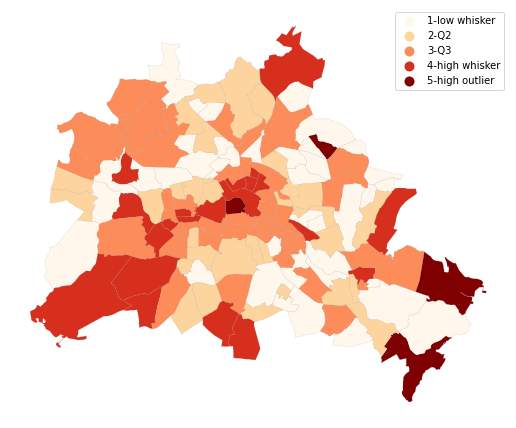

In [27]:
bpl = [labels [b] for b in bp.yb]

f, ax = plt.subplots(1, figsize=(9, 9))
df.assign(cl=bpl).plot(column='cl', categorical=True, k=4, cmap='OrRd', linewidth=0.1, ax=ax, edgecolor='grey', legend=True)
ax.set_axis_off()
plt.show()